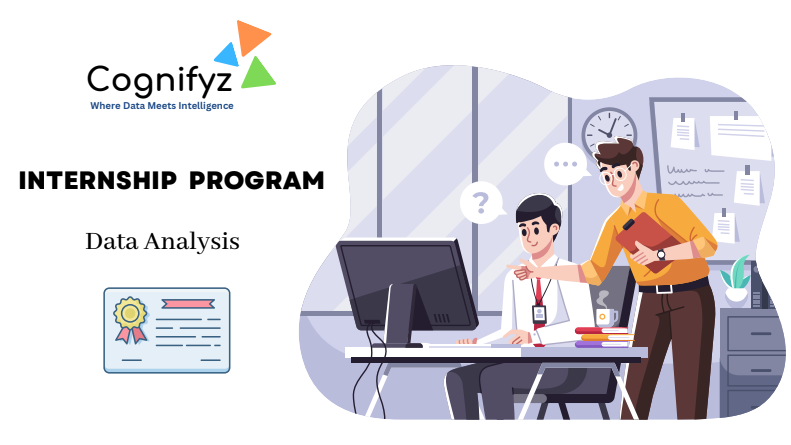

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df=pd.read_csv("Dataset.csv")
df.head(2)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591


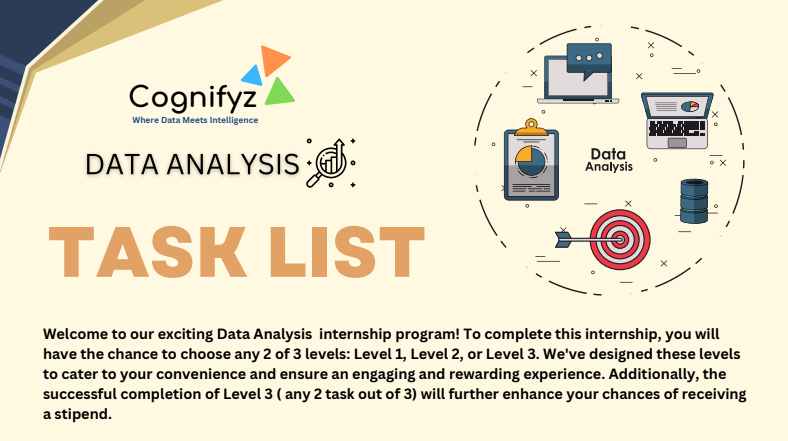

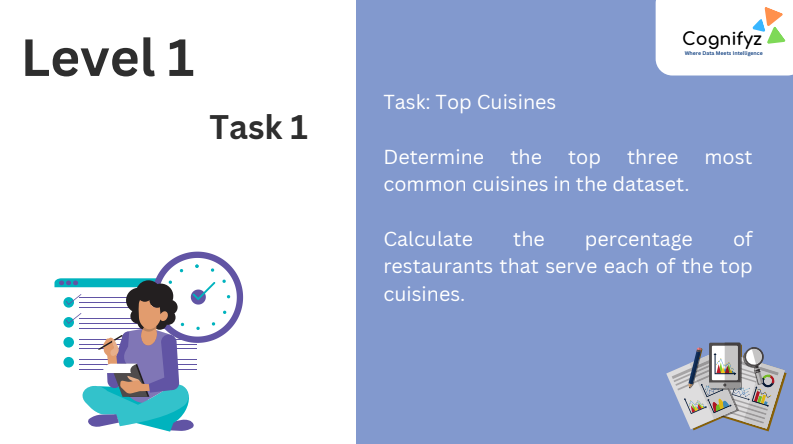

In [8]:
#Top three most common cuisines
cuisines_count = df['Cuisines'].value_counts()
cuisines_count.head(3)

Cuisines
North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: count, dtype: int64

In [12]:
total_restaurants = len(df)
total_restaurants

9551

In [18]:
# calculate the percentage of restarutant that serve each of the top cuisines
percentages = (cuisines_count / total_restaurants) * 100
percentages.head(3)

Cuisines
North Indian             9.800021
North Indian, Chinese    5.350225
Chinese                  3.706418
Name: count, dtype: float64

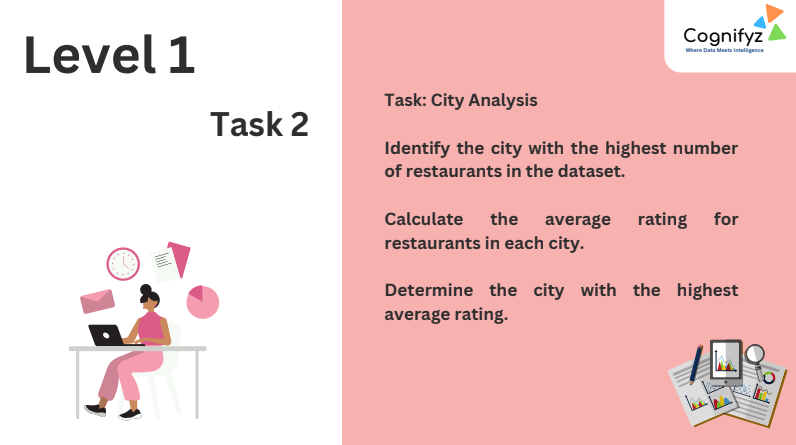

In [33]:
#city Analysis Identify the city with the highest number of restaurants
city_most_restaurants = df['City'].value_counts().head(1)
city_most_restaurants

City
New Delhi    5473
Name: count, dtype: int64

In [37]:
#calculate the average rating for restaruants in each city
average_ratings = df.groupby('City')['Aggregate rating'].mean()
average_ratings

City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64

In [39]:
# Detemine the city with the highest average rating
city_highest_rating = average_ratings.idxmax()
city_highest_rating

#OR
#city_highest_rating = average_ratings.head(1).index[0]
#city_highest_rating

'Inner City'

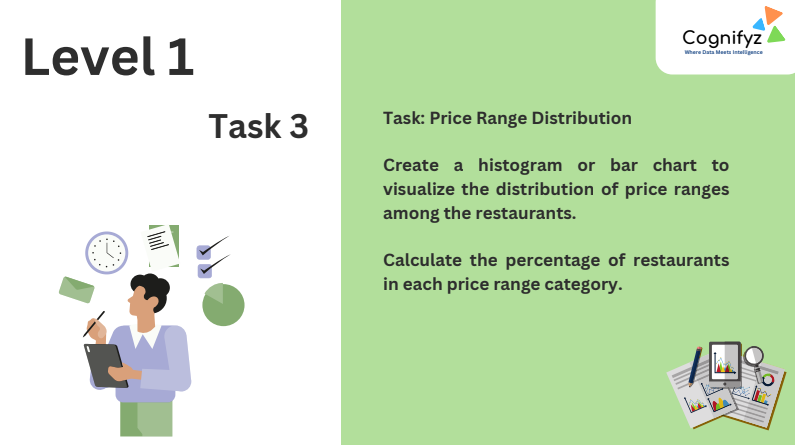

In [56]:
# price range
price_range_counts = df['Price range'].value_counts()
price_range_counts

Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64

In [58]:
total_restaurants = len(df)
total_restaurants

9551

In [60]:
#calculate the percentagw of resaurants in each price range category
percentages = (price_range_counts / total_restaurants) * 100
percentages

Price range
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: count, dtype: float64

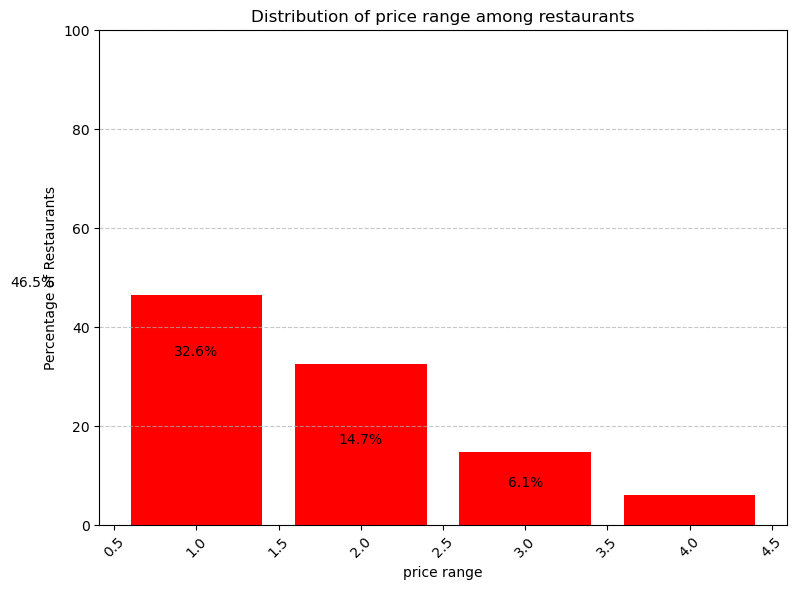

In [96]:
#creat a histogram or bar chart to visulaize the disctribution of price ranges]
plt.figure(figsize=(8, 6))
plt.bar(percentages.index, percentages.values, color = 'red')
plt.xlabel('price range')
plt.ylabel('Percentage of Restaurants')
plt.title('Distribution of price range among restaurants')
plt.ylim(0,100)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
for i, v in enumerate(percentages.values):
    plt.text(i, v + 1, f"{v:.1f}%", ha='center' , va='bottom', fontsize=10)
plt.tight_layout()
plt.show()

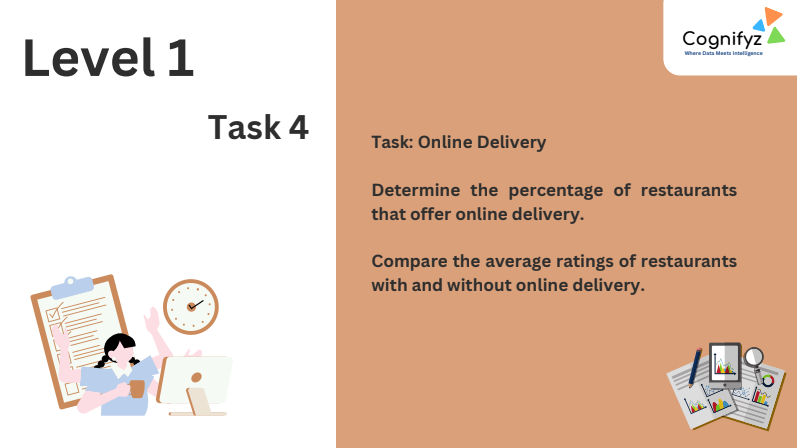

In [127]:
# Calculate the percentage of restaurants offering online delivery
online_delivery_percentage = df['Has Online delivery'].map({'Yes': True, 'No': False}).sum()
online_delivery_percentage

2451

In [145]:
# Calculate average rating for restaurants with and without online delivery
average_rating_with_delivery = df.loc[df['Has Online delivery'] == 'Yes', 'Aggregate rating'].mean()
average_rating_without_delivery = df.loc[df['Has Online delivery'] == 'No', 'Aggregate rating'].mean()

# Print the results
print("Average rating with delivery:", average_rating_with_delivery)
print("Average rating without delivery:", average_rating_without_delivery)

Average rating with delivery: 3.2488372093023257
Average rating without delivery: 2.465295774647887


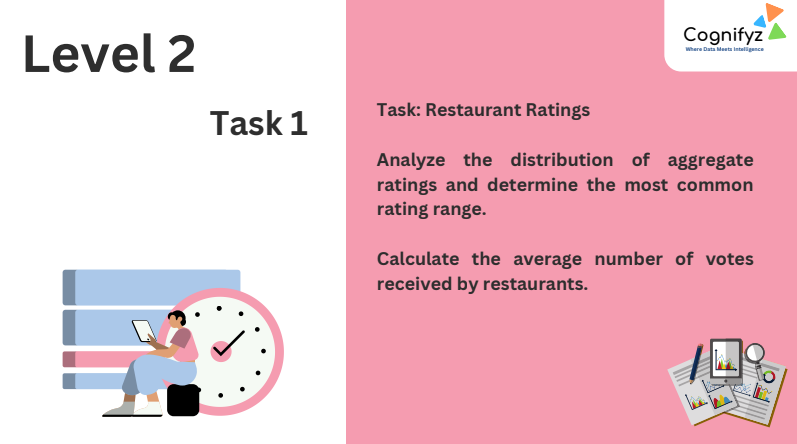

In [152]:
#calculate the value counts of the 'Aggregate rating' column
rating_counts = df['Aggregate rating'].value_counts()
print(rating_counts)

Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64


In [154]:
#Calculate the average number of votes received by restaurants.
average_votes = df['Votes'].mean()
print("Average number of votes:", average_votes)

Average number of votes: 156.909747670401


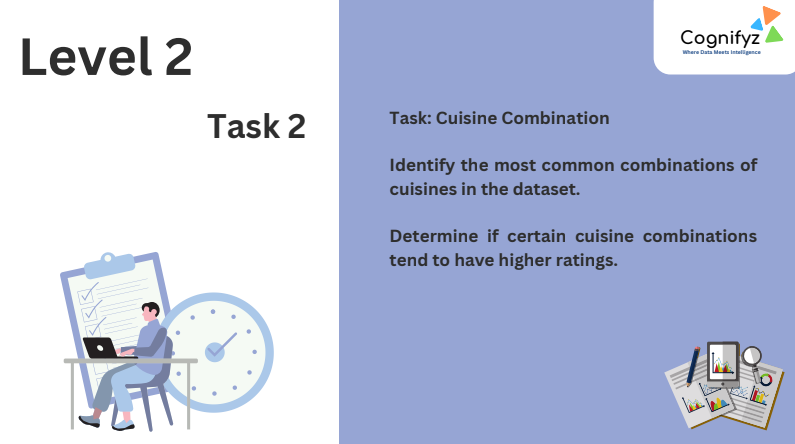

In [187]:
# Splitting and counting cuisine combinations
cuisine_combinations = df['Cuisines'].str.split(', ')
combination_counts = cuisine_combinations.explode().value_counts()

# Identifying the most common combination
most_common_combination = combination_counts.idxmax()
most_common_count = combination_counts.max()

print(f"The most common cuisine combination is '{most_common_combination}' with {most_common_count} occurrences.")

The most common cuisine combination is 'North Indian' with 3960 occurrences.


In [193]:
# To determine fi certain combination have higher ratings
combination_rating = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
print(combination_rating.head(10))

Cuisines
Italian, Deli               4.9
Hawaiian, Seafood           4.9
American, Sandwich, Tea     4.9
Continental, Indian         4.9
European, Asian, Indian     4.9
European, Contemporary      4.9
European, German            4.9
BBQ, Breakfast, Southern    4.9
American, Coffee and Tea    4.9
Sunda, Indonesian           4.9
Name: Aggregate rating, dtype: float64


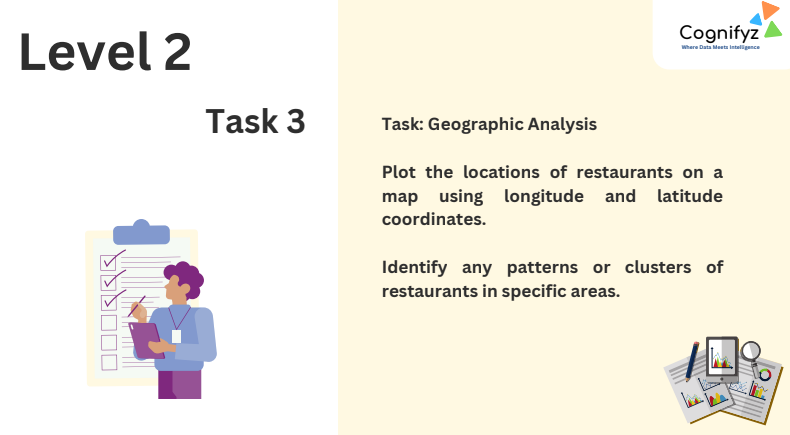

In [196]:
!pip install folium==0.14.0

   ---------------------------------------- 0.0/102.3 kB ? eta -:--:--
   ----------- --------------------------- 30.7/102.3 kB 660.6 kB/s eta 0:00:01
   ---------------------------------------- 102.3/102.3 kB 1.5 MB/s eta 0:00:00


In [210]:
import folium

# Calculate the map center based on mean latitude and longitude
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]

# Create a folium map centered around the mean latitude and longitude
my_map = folium.Map(location=map_center, zoom_start=10)

# Add markers for each restaurant
for _, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(my_map)

# Display the map
my_map

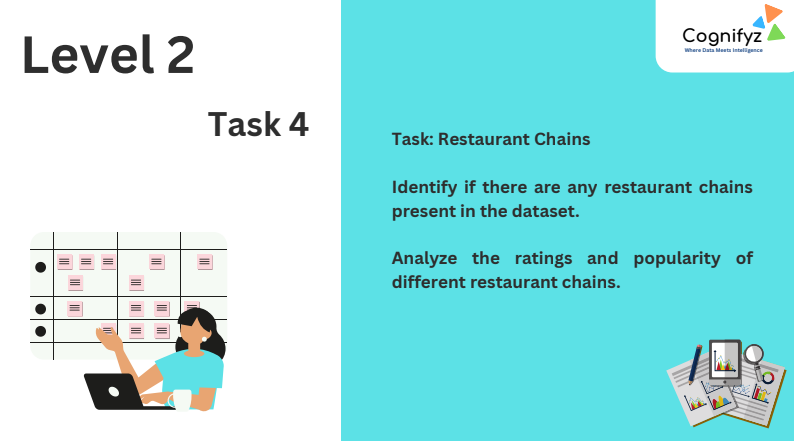

In [213]:
# Group the DataFrame by 'Restaurant Name' and count the occurrences
restaurant_counts = df['Restaurant Name'].value_counts().head(10)
restaurant_counts

Restaurant Name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
Keventers           34
Pizza Hut           30
Giani               29
Baskin Robbins      28
Barbeque Nation     26
Name: count, dtype: int64

In [217]:
# Filter for restaurants with counts greater than 1
chains = restaurant_counts[restaurant_counts > 1]
print("Restaurant chains and their counts:")
print(chains)

Restaurant chains and their counts:
Restaurant Name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
Keventers           34
Pizza Hut           30
Giani               29
Baskin Robbins      28
Barbeque Nation     26
Name: count, dtype: int64


In [221]:
#Analysis rating and popularity
chain_ratings = df[df['Restaurant Name'].isin(chains.index)].groupby('Restaurant Name')['Aggregate rating'].mean()
print("\nAverage ratings of restaurants chains:")
print(chain_ratings)


Average ratings of restaurants chains:
Restaurant Name
Barbeque Nation     4.353846
Baskin Robbins      1.860714
Cafe Coffee Day     2.419277
Domino's Pizza      2.740506
Giani               2.689655
Green Chick Chop    2.672549
Keventers           2.870588
McDonald's          3.339583
Pizza Hut           3.320000
Subway              2.907937
Name: Aggregate rating, dtype: float64


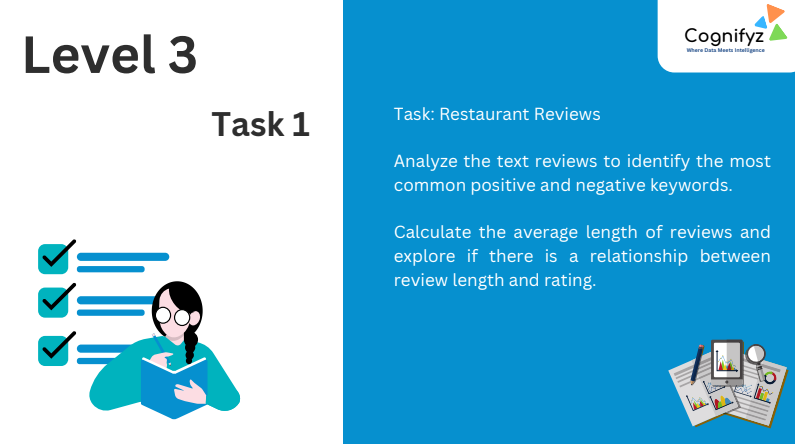

In [307]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.tokenize import word_tokenize


# Define positive and negative words (replace with your actual lists)
positive_words = ['great', 'delicious', 'amazing', 'recommend']
negative_words = ['terrible', 'cold', 'disappointing', 'overpriced']

def preprocess_reviews(reviews):
    stop_words = set(stopwords.words('english'))
    processed_reviews = []
    
    for review in reviews:
        tokens = word_tokenize(review.lower())
        processed_tokens = [token for token in tokens if token not in stop_words and token.isalnum()]
        processed_reviews.append(processed_tokens)
    
    return processed_reviews

def analyze_keywords(df, positive_words, negative_words):
    positive_counts = Counter()
    negative_counts = Counter()
    
    processed_reviews = preprocess_reviews(df['Review'])
    rating_texts = df['Rating text']
    
    for review, rating_text in processed_review:
        for word in review:
            if word in positive_words:
                positive_counts[word] += 1
            elif word in negative_words:
                negative_counts[word] += 1
    
    print("Most common positive keywords:", positive_counts.most_common(5))
    print("Most common negative keywords:", negative_counts.most_common(5))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Sandipan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Sandipan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [325]:
review_lengths = [len(word_tokenize(review)) for review in reviews]
average_length = sum(review_lengths) / len(review_lengths)


# Example usage:

print("Average review length:", average_length)

Average review length: 14.5


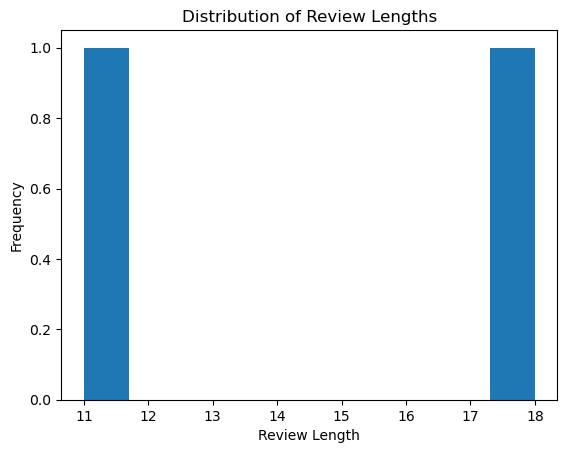

In [329]:
plt.hist(review_lengths, bins=10)
plt.xlabel('Review Length')
plt.ylabel('Frequency')
plt.title('Distribution of Review Lengths')
plt.show()

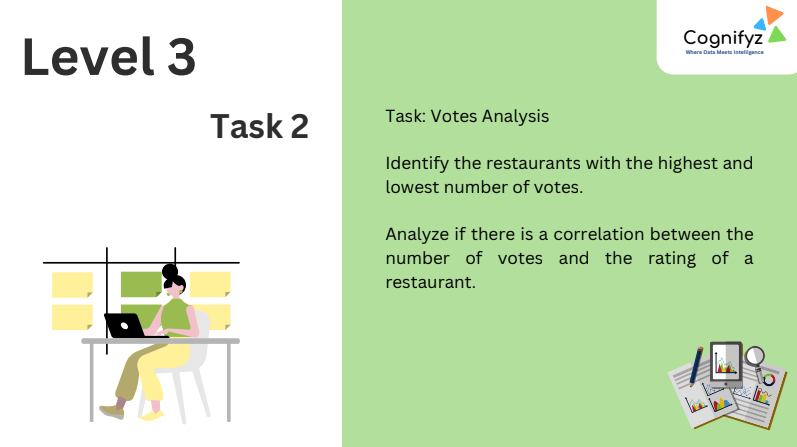

In [360]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [362]:
df=pd.read_csv("Dataset.csv")

In [364]:
# Sort by votes in descending order to find restaurants with highest votes
highest_votes_restaurants = df.sort_values(by='Votes', ascending=False).head()
print("Restaurants with highest Votes:")
print(highest_votes_restaurants[['Restaurant Name', 'Votes']])

# Sort by votes in ascending order to find restaurants with lowest votes
lowest_votes_restaurants = df.sort_values(by='Votes', ascending=True).head()
print("\nRestaurants with lowest Votes:")
print(lowest_votes_restaurants[['Restaurant Name', 'Votes']])

Restaurants with highest Votes:
                Restaurant Name  Votes
728                        Toit  10934
735                    Truffles   9667
3994           Hauz Khas Social   7931
2412                  Peter Cat   7574
739   AB's - Absolute Barbecues   6907

Restaurants with lowest Votes:
                 Restaurant Name  Votes
5799         Khalsa Eating Point      0
7411   Radha Swami Chaat Bhandar      0
7414  Ram Ram Ji Kachori Bhandar      0
7415          Rana's Food Corner      0
7416         Sanjay Chicken Shop      0


In [368]:
correlation = df['Votes'].corr(df['Aggregate rating'])
print("Correlation between votes and rating:", correlation)

Correlation between votes and rating: 0.31369058419541035


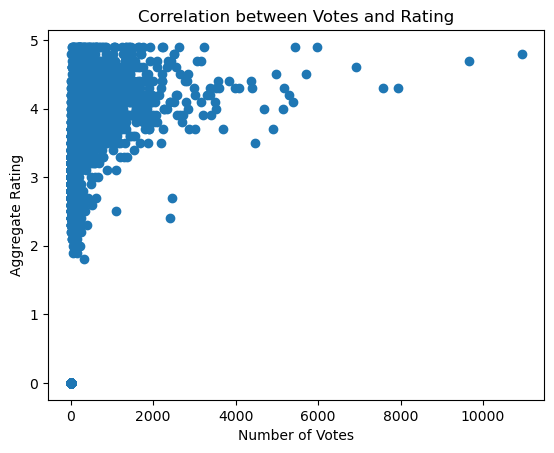

In [370]:
plt.scatter(df['Votes'], df['Aggregate rating'])
plt.xlabel('Number of Votes')
plt.ylabel('Aggregate Rating')
plt.title('Correlation between Votes and Rating') 
plt.show()

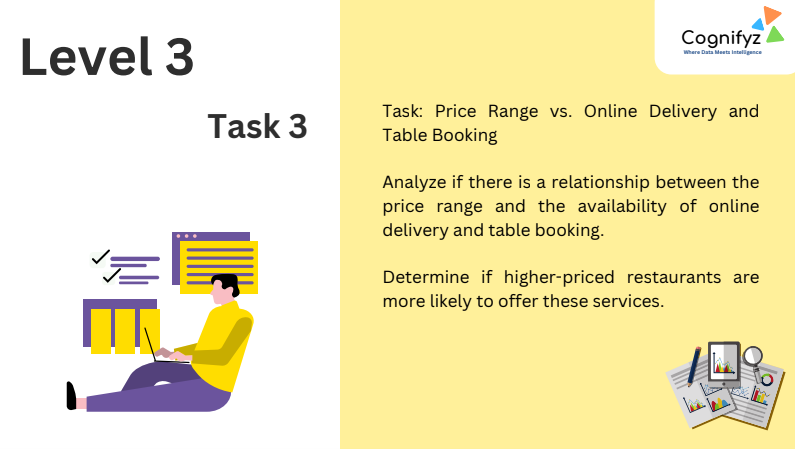

In [373]:
pd.crosstab(df['Price range'], df['Has Table booking'])

Has Table booking,No,Yes
Price range,,
1,4443,1
2,2874,239
3,764,644
4,312,274


In [379]:
delivery_by_price = df.groupby('Price range')['Has Online delivery'].value_counts()
booking_by_price = df.groupby('Price range')['Has Table booking'].value_counts()

print(delivery_by_price)
print(booking_by_price)

Price range  Has Online delivery
1            No                     3743
             Yes                     701
2            No                     1827
             Yes                    1286
3            No                      997
             Yes                     411
4            No                      533
             Yes                      53
Name: count, dtype: int64
Price range  Has Table booking
1            No                   4443
             Yes                     1
2            No                   2874
             Yes                   239
3            No                    764
             Yes                   644
4            No                    312
             Yes                   274
Name: count, dtype: int64
